# Vehicle Detection Project

In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
from lesson_functions import *
import glob
import time
import os

In [3]:
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, PredefinedSplit, cross_val_predict, validation_curve
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

In [4]:
from scipy.ndimage.measurements import label

In [5]:
# create vehicle img list. We mark whether the data belongs to a certain GTI data directory.

vehicle_GTI_dirs = ['./data/vehicles/GTI_Far/', './data/vehicles/GTI_Left/', './data/vehicles/GTI_MiddleClose/', './data/vehicles/GTI_Right/']
vehicle_img_list = []
GTI_group_ids = []
cgroup_id = 1
for GTI_dir in vehicle_GTI_dirs:
    GTI_current_list = glob.glob(GTI_dir + '*.png')  
    vehicle_img_list = vehicle_img_list + GTI_current_list   
    GTI_group_ids = GTI_group_ids + [np.ones(len(GTI_current_list))*cgroup_id]
    cgroup_id += 1
KTTI_list = glob.glob('./data/vehicles/KITTI_extracted/*.png')
vehicle_img_list = vehicle_img_list+ KTTI_list
vehicle_group_id = np.concatenate(GTI_group_ids + [np.zeros(len(KTTI_list))])

# create non vehicle img list and group ids for non-vehicle data
non_vehicle_img_list = (glob.glob('./data/non-vehicles/GTI/*.png') + glob.glob('./data/non-vehicles/Extras/*.png'))
                        #+glob.glob('./data/non-vehicles/Negative_Examples/*.png'))
non_vehicle_group_id = np.zeros(len(non_vehicle_img_list))


# data augmentation

In [6]:
def random_brightness(img):
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    #img_hsv = color.convert_colorspace(img, 'RGB', 'HSV')
    img_hsv[:,:,-1] = img_hsv[:,:,-1]*(np.random.uniform(0.5, 1.5))    
    return cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)  

In [7]:
vehicle_images =  [(cv2_readRGB(w)) for w in vehicle_img_list]
#+ [random_brightness(cv2_readRGB(w)) for w in vehicle_img_list]
non_vehicle_images =  [(cv2_readRGB(w)) for w in non_vehicle_img_list]
#+ [random_brightness(cv2_readRGB(w)) for w in non_vehicle_img_list]        

group_id = np.concatenate([vehicle_group_id, non_vehicle_group_id]).astype(int)     

   

In [8]:
from sklearn.utils import shuffle
def obtain_fold_group(group_id,K):
    # divide data into K folds and return the fold index each sample belongs to
    test_fold_index = np.zeros_like(group_id)
    for c_id in np.unique(group_id):
        n_sample_in_group = np.sum(group_id == c_id)
        if c_id ==0:
            test_fold_index[group_id == c_id] = shuffle(np.floor_divide(np.arange(0, n_sample_in_group), np.ceil(n_sample_in_group/K)),random_state=0) 
        else:
            test_fold_index[group_id == c_id] = np.floor_divide(np.arange(0, n_sample_in_group), np.ceil(n_sample_in_group/K))
    return test_fold_index.astype(int)            

In [9]:
fold_indices = obtain_fold_group(group_id, 5)

In [10]:
orient = 9  # HOG orientations
color_space = 'YCrCb' 
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = [1,2] # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

In [11]:
car_features = extract_features(vehicle_images, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(non_vehicle_images, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
X_scaler = StandardScaler().fit(X)
scaled_X = X_scaler.transform(X)
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

In [12]:
X_test = scaled_X[fold_indices==0,:]
y_test = y[fold_indices==0]
X_train_validate = scaled_X[fold_indices!=0,:]
y_train_validate = y[fold_indices!=0]
fold_train_validate = fold_indices[fold_indices!=0]

## Search for Best SVM parameter

In [13]:
# test errors
clf = LinearSVC(C=1)
#clf = RandomForestClassifier()
t=time.time()
clf.fit(X_train_validate, y_train_validate)
t2 = time.time()
print('Test Accuracy of Classifier = ', round(clf.score(X_test, y_test), 4))

Test Accuracy of Classifier =  0.9752


## Set windows

In [46]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def search_cars_per_window(img, x_start_stop, y_start_stop, xy_window, xy_overlap,              
                           clf, X_scaler, color_space, hog_channel, orient, pix_per_cell, cell_per_block, spatial_size,
                           hist_bins, spatial_feat=spatial_feat, 
                           hist_feat=hist_feat, hog_feat=hog_feat): 
    """apply the vehicle/non-vehicle classifier to a set of windows defined by x_start_stop, y_start_stop, xy_window, xy_overlap
    
    This function precompute the Hog feature cross the entire applicable region
    """
    window_size = 64
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_steps = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_steps = np.int((yspan-ny_buffer)/ny_pix_per_step) 


    # remove extra region that are not covered by window in xspan, yspan definition
    xspan = nx_pix_per_step*nx_steps+nx_buffer
    yspan = nx_pix_per_step*ny_steps+nx_buffer

    nblocks_per_window = (window_size // pix_per_cell) - cell_per_block + 1
    nx_cell_per_step = np.int(window_size//pix_per_cell*(1 - xy_overlap[0])) 
    ny_cell_per_step = np.int(window_size//pix_per_cell*(1 - xy_overlap[1]))

    # convert the window and step size setting to the resized image


    img_region_for_search = img[y_start_stop[0]:(y_start_stop[0]+yspan),x_start_stop[0]:(x_start_stop[0]+xspan)]
    xyspan_resized =(pix_per_cell* nx_cell_per_step * (nx_steps-1) + window_size,
                     pix_per_cell* ny_cell_per_step * (ny_steps-1) + window_size)
    x_scale = np.float32(xyspan_resized[0]) / xspan
    y_scale = np.float32(xyspan_resized[1]) / yspan
    img_region_resized = cv2.resize(img_region_for_search, xyspan_resized)


    # Initialize a list to append window positions to                            
    color_space_image = convert_RGB_to_color_space(img_region_resized, color_space)

    #print(color_space_image.shape)
    
    on_windows = []
    for xb in range(nx_steps):
        for yb in range(ny_steps):
            ypos = yb*nx_cell_per_step
            xpos = xb*ny_cell_per_step
            # Extract HOG for this patch

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg_RGB = img_region_resized[ytop:ytop+window_size, xleft:xleft+window_size]#, (64,64)
            #print(subimg_RGB.shape)
            #return subimg_RGB
            test_features = extract_features([subimg_RGB], color_space=color_space, 
                                    spatial_size=spatial_size, hist_bins=hist_bins, 
                                    orient=orient, pix_per_cell=pix_per_cell, 
                                    cell_per_block=cell_per_block, 
                                    hog_channel=hog_channel, spatial_feat=spatial_feat, 
                                    hist_feat=hist_feat, hog_feat=hog_feat)            
            test_features = X_scaler.transform(test_features)
            test_prediction = clf.predict(test_features)

            if test_prediction == 1:
                x_window_start = x_start_stop[0]+np.int(xleft*x_scale)
                y_window_start = y_start_stop[0]+np.int(ytop*y_scale)
                on_windows.append(((x_window_start, y_window_start),
                                   (x_window_start+xy_window[0], y_window_start+xy_window[1])))
    return on_windows, xyspan_resized                               

In [32]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def search_cars(img, x_start_stop, y_start_stop, xy_window, xy_overlap,              
                clf, X_scaler, color_space, hog_channel, orient, pix_per_cell, cell_per_block, spatial_size,
                hist_bins, spatial_feat=spatial_feat, 
                hist_feat=hist_feat, hog_feat=hog_feat): 
    """apply the vehicle/non-vehicle classifier to a set of windows defined by x_start_stop, y_start_stop, xy_window, xy_overlap
    
    This function precompute the Hog feature cross the entire applicable region
    """
    window_size = 64
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_steps = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_steps = np.int((yspan-ny_buffer)/ny_pix_per_step) 


    # remove extra region that are not covered by window in xspan, yspan definition
    xspan = nx_pix_per_step*nx_steps+nx_buffer
    yspan = nx_pix_per_step*ny_steps+nx_buffer

    nblocks_per_window = (window_size // pix_per_cell) - cell_per_block + 1
    nx_cell_per_step = np.int(window_size//pix_per_cell*(1 - xy_overlap[0])) 
    ny_cell_per_step = np.int(window_size//pix_per_cell*(1 - xy_overlap[1]))

    # convert the window and step size setting to the resized image


    img_region_for_search = img[y_start_stop[0]:(y_start_stop[0]+yspan),x_start_stop[0]:(x_start_stop[0]+xspan)]
    xyspan_resized =(pix_per_cell* nx_cell_per_step * (nx_steps-1) + window_size,
                     pix_per_cell* ny_cell_per_step * (ny_steps-1) + window_size)
    x_scale = np.float32(xyspan_resized[0]) / xspan
    y_scale = np.float32(xyspan_resized[1]) / yspan
    img_region_resized = cv2.resize(img_region_for_search, xyspan_resized)


    # Initialize a list to append window positions to                            
    color_space_image = convert_RGB_to_color_space(img_region_resized, color_space)
    hog_featgures_whole_image = [get_hog_features(color_space_image[:,:,w],
                                                  orient, pix_per_cell, cell_per_block, feature_vec=False)
                                 for w in hog_channel]
        
    on_windows = []
    for xb in range(nx_steps):
        for yb in range(ny_steps):
            ypos = yb*nx_cell_per_step
            xpos = xb*ny_cell_per_step
            # Extract HOG for this patch

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = color_space_image[ytop:ytop+window_size, xleft:xleft+window_size]#, (64,64)

            # Get color features
            #spatial_features = bin_spatial(subimg, size=spatial_size)
            #hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            feature_list = []
            if spatial_feat == True:
                spatial_features = bin_spatial(subimg, size=spatial_size)
                feature_list.append(spatial_features)
            if hist_feat == True:
                # Apply color_hist()
                hist_features = color_hist(subimg, nbins=hist_bins)
                feature_list.append(hist_features)
            if hog_feat == True:
                hog_features = np.ravel([w[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() for w in hog_featgures_whole_image])

                feature_list.append(hog_features)
            test_features = X_scaler.transform(np.concatenate(feature_list).reshape(1, -1))
            test_prediction = clf.predict(test_features)

            if test_prediction == 1:
                x_window_start = x_start_stop[0]+np.int(xleft*x_scale)
                y_window_start = y_start_stop[0]+np.int(ytop*y_scale)
                on_windows.append(((x_window_start, y_window_start),
                                   (x_window_start+xy_window[0], y_window_start+xy_window[1])))
    return on_windows, xyspan_resized                               

In [15]:
test_image_files = glob.glob('./test_images/*.jpg')
test_images = [cv2_readRGB(w) for w in test_image_files]

In [57]:
slide_windows = [{'x_start_stop':[None, None], 'y_start_stop':[400, 550], 'xy_window':(64, 64), 'xy_overlap':(0.875, 0.875)},
                 {'x_start_stop':[None, None], 'y_start_stop':[432, 600], 'xy_window':(96, 96), 'xy_overlap':(0.875, 0.875)},
                 {'x_start_stop':[None, None], 'y_start_stop':[464, 700], 'xy_window':(128, 128), 'xy_overlap':(0.75, 0.75)},
                 {'x_start_stop':[None, None], 'y_start_stop':[496, 700], 'xy_window':(160, 160), 'xy_overlap':(0.75, 0.75)}
                ]   

In [26]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip

In [27]:
clip = VideoFileClip("test_video.mp4")

In [28]:
test_images = [clip.get_frame(t) for t in np.arange(0,1, 1.0/25)]

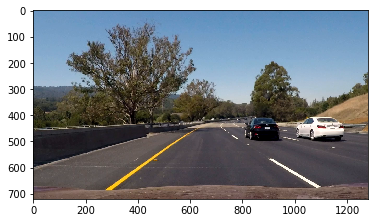

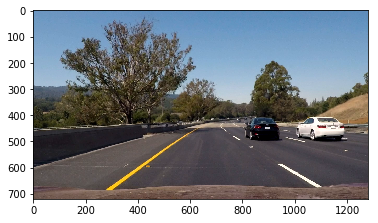

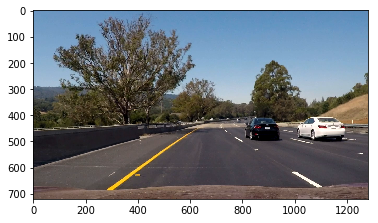

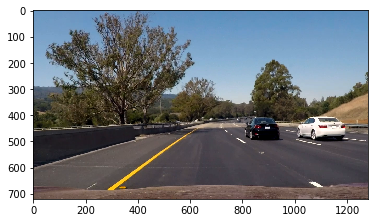

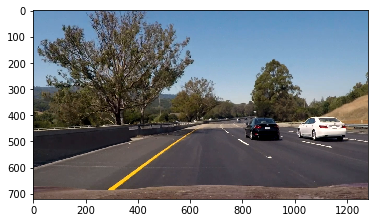

...

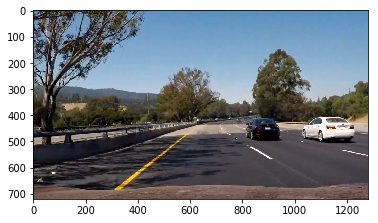

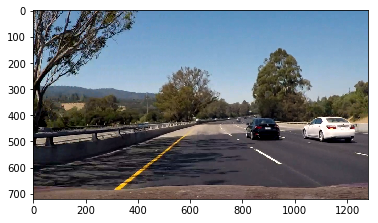

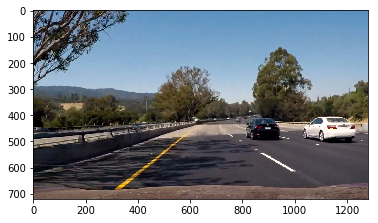

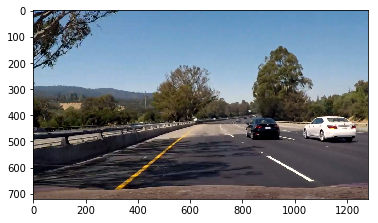

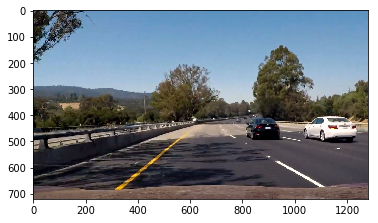

In [29]:
for test_image in test_images:
    plt.figure()
    plt.imshow(test_image)

In [21]:
def get_labeled_bboxes(labels):
    if labels[1]>=1:
        bbox = np.zeros((labels[1], 4))
        for car_number in range(1, labels[1]+1):
            # Find pixels with each car_number label value
            nonzero = (labels[0] == car_number).nonzero()
            # Identify x and y values of those pixels
            nonzeroy = np.array(nonzero[0])
            nonzerox = np.array(nonzero[1])
            # Define a bounding box based on min/max x and y
            bbox[car_number-1,:] = np.array([np.min(nonzerox), np.min(nonzeroy), np.max(nonzerox), np.max(nonzeroy)])        
    else:
        bbox = None
    return bbox


In [22]:

def get_labeled_bboxes_v2(labels):
    bbox = np.zeros(label[1], 4)
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox[car_number,:] = np.array([np.min(nonzerox), np.min(nonzeroy), np.max(nonzerox), np.max(nonzeroy)])        
    return bbox

In [30]:
class HotWindowHistory():
    def __init__(self, image_size, n_frame=3, per_frame_threshold=2, threshold=2):        
        # n_frame: number of frame for calculating bbox
        # threshold: thresholding for calculate heat map among frames
        self.hot_windows_list = []
        self.heat_list = []
        self.n_frame = n_frame
        self.per_frame_threshold = per_frame_threshold        
        self.threshold = threshold
        self.image_size = image_size
        
    def update_hot_window(self, hot_windows):        

        self.hot_windows_list.append(hot_windows)
        self.heat_list.append(add_heat(np.zeros(self.image_size).astype(np.int),
                                  hot_windows)
                             )
        
        if len(self.hot_windows_list)>=(self. n_frame+1):
            self.hot_windows_list.pop(0)
            self.heat_list.pop(0)
    
    def get_joint_heatmap(self):
        joint_heatmap = np.zeros(self.image_size).astype(np.int)
        for w in self.heat_list:
            joint_heatmap =joint_heatmap + (w>=self.per_frame_threshold).astype(np.int)
        return joint_heatmap
        
    def get_bbox(self):
        joint_heatmap = self.get_joint_heatmap()
        #joint_heatmap = apply_threshold(joint_heatmap, self.threshold)
        labels = label(apply_threshold(joint_heatmap, self.threshold))
        bbox_list = get_labeled_bboxes(labels)   
        
        return bbox_list, joint_heatmap
    
        # return bbox
        

In [59]:
help(label)

Help on function label in module scipy.ndimage.measurements:

label(input, structure=None, output=None)
    Label features in an array.
    
    Parameters
    ----------
    input : array_like
        An array-like object to be labeled.  Any non-zero values in `input` are
        counted as features and zero values are considered the background.
    structure : array_like, optional
        A structuring element that defines feature connections.
        `structure` must be symmetric.  If no structuring element is provided,
        one is automatically generated with a squared connectivity equal to
        one.  That is, for a 2-D `input` array, the default structuring element
        is::
    
            [[0,1,0],
             [1,1,1],
             [0,1,0]]
    
    output : (None, data-type, array_like), optional
        If `output` is a data type, it specifies the type of the resulting
        labeled feature array
        If `output` is an array-like object, then `output` will be u

In [60]:
class HotWindowHistory_V2():
    def __init__(self, image_size, n_frame=3, per_frame_threshold=2, threshold=2):        
        # n_frame: number of frame for calculating bbox
        # threshold: thresholding for calculate heat map among frames
        self.hot_windows_list = []
        self.heat_list = []
        self.n_frame = n_frame
        self.per_frame_threshold = per_frame_threshold        
        self.threshold = threshold
        self.image_size = image_size
        
    def update_hot_window(self, hot_windows):        

        self.hot_windows_list.append(hot_windows)
        self.heat_list.append(add_heat(np.zeros(self.image_size).astype(np.int),
                                  hot_windows)
                             )
        
        if len(self.hot_windows_list)>=(self. n_frame+1):
            self.hot_windows_list.pop(0)
            self.heat_list.pop(0)
    
    def get_joint_heatmap(self):
        joint_heatmap = np.zeros(self.image_size).astype(np.int)
        for w in self.heat_list:
            joint_heatmap =joint_heatmap + (w>=self.per_frame_threshold).astype(np.int)
        return joint_heatmap
        
    def get_bbox(self):
        joint_heatmap = self.get_joint_heatmap()
        #joint_heatmap = apply_threshold(joint_heatmap, self.threshold)
        mask = apply_threshold(joint_heatmap, self.threshold)
        filtered_heatmap = np.zeros(self.image_size).astype(np.int)
        for box in self.hot_windows_list[-1]:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
            if (mask[box[0][1]:box[1][1], box[0][0]:box[1][0]]>=1).any():                
                filtered_heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1                        
        labels = label(filtered_heatmap)
        bbox_list = get_labeled_bboxes(labels)   
        
        return bbox_list, joint_heatmap
    
        # return bbox
        

In [70]:
def process_frame_to_bbox(frame_image):
    hot_windows = []
    for window_group in slide_windows:
        hot_windows_current_group, xyspan_resized = search_cars(frame_image,
                                                                x_start_stop=window_group['x_start_stop'],
                                                                y_start_stop=window_group['y_start_stop'],
                                                                xy_window=window_group['xy_window'],
                                                                xy_overlap=window_group['xy_overlap'],
                                                                clf=clf, X_scaler=X_scaler,
                                                                color_space=color_space, 
                                                                spatial_size=spatial_size, hist_bins=hist_bins, 
                                                                orient=orient, pix_per_cell=pix_per_cell, 
                                                                cell_per_block=cell_per_block, 
                                                                hog_channel=hog_channel, spatial_feat=spatial_feat, 
                                                                hist_feat=hist_feat, hog_feat=hog_feat)                       
        hot_windows = hot_windows + hot_windows_current_group
        
    # update history of hot windows    
    hot_window_record.update_hot_window(hot_windows)
    bbox_list, joint_heatmap = hot_window_record.get_bbox()
    return bbox_list, joint_heatmap

In [71]:
def process_frame(frame_image):
    bbox_list, joint_heatmap = process_frame_to_bbox(frame_image)
    if bbox_list is not None:
        bbox_on_image = draw_boxes(np.copy(frame_image), [((w[0],w[1]), (w[2], w[3])) for w in bbox_list.astype(np.int)],
                                color=(0,255,0))
    else:
        bbox_on_image = np.copy(frame_image)
    return bbox_on_image

In [72]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [76]:
clip1 = VideoFileClip("./project_video.mp4")
#white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
#%time white_clip.write_videofile(white_output, audio=False)
clip2 = clip1.subclip(0,30)

In [77]:
output_video = './output_videos/vehicle_video.mp4'
output_clip = clip2.fl_image(process_frame)
output_clip.write_videofile(output_video)

[MoviePy] >>>> Building video ./output_videos/vehicle_video.mp4
[MoviePy] Writing audio in vehicle_videoTEMP_MPY_wvf_snd.mp3


100%|██████████| 662/662 [00:00<00:00, 2139.56it/s]

[MoviePy] Done.
[MoviePy] Writing video ./output_videos/vehicle_video.mp4



100%|█████████▉| 750/751 [24:26<00:01,  1.93s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_videos/vehicle_video.mp4 



In [78]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_video))

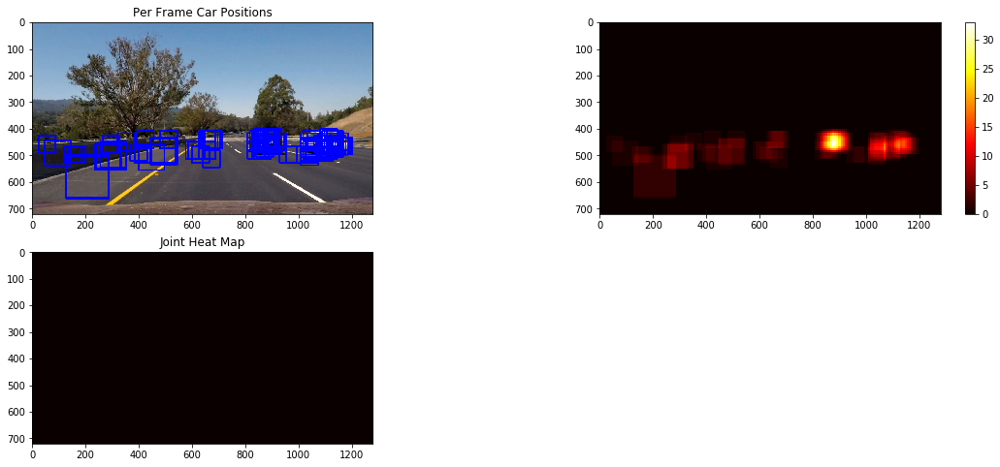

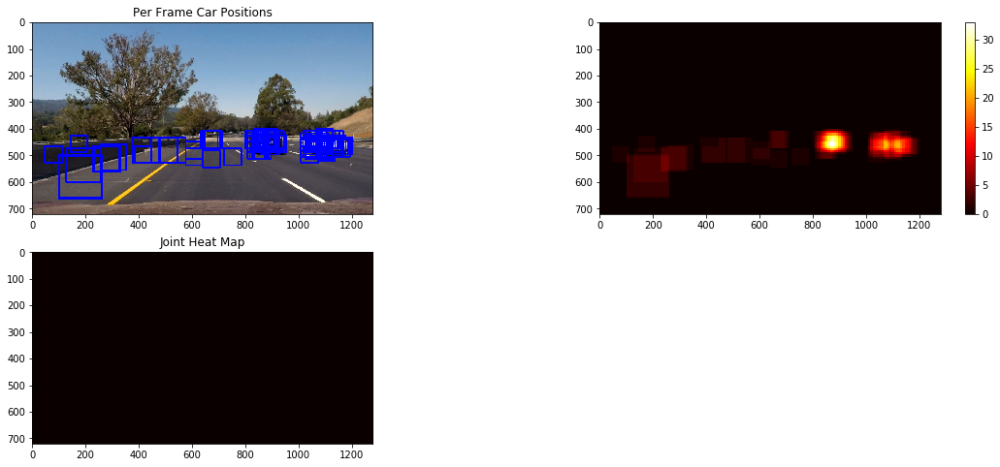

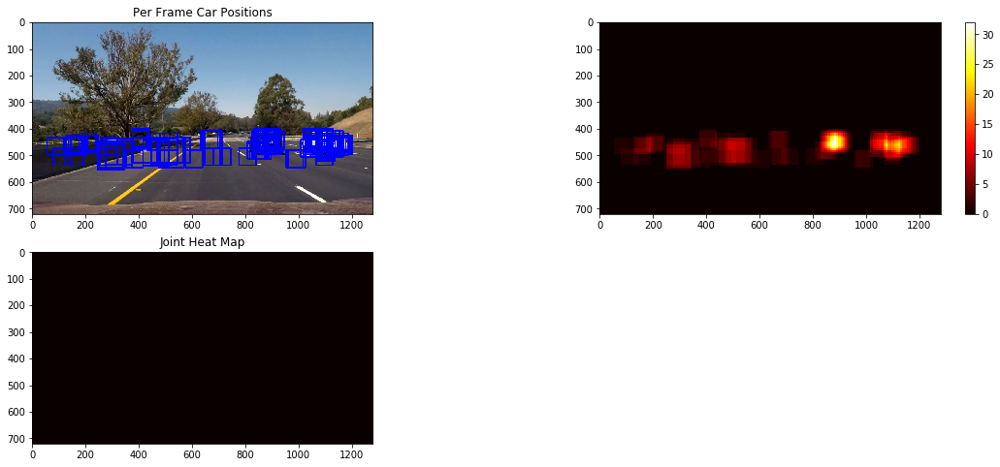

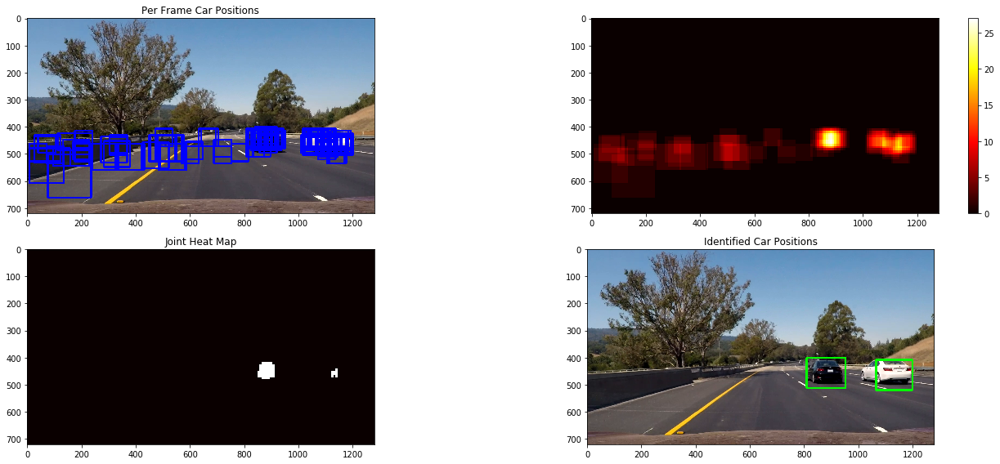

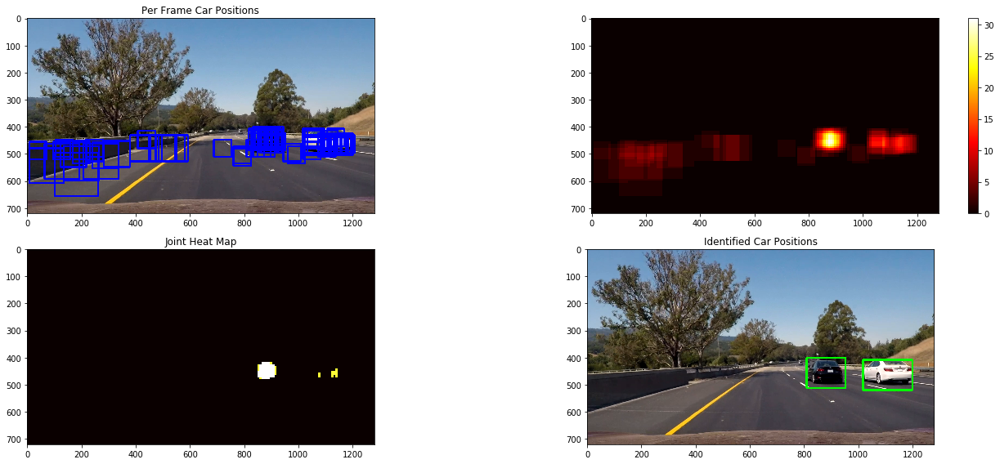

...

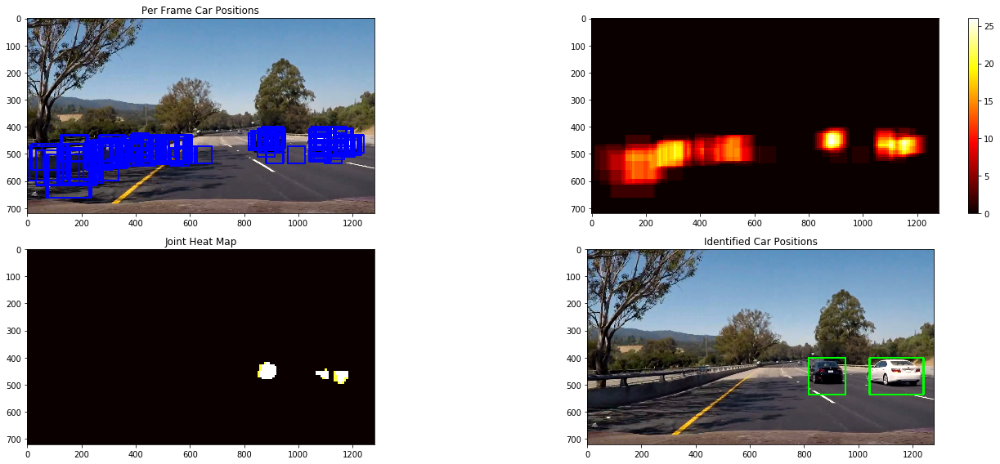

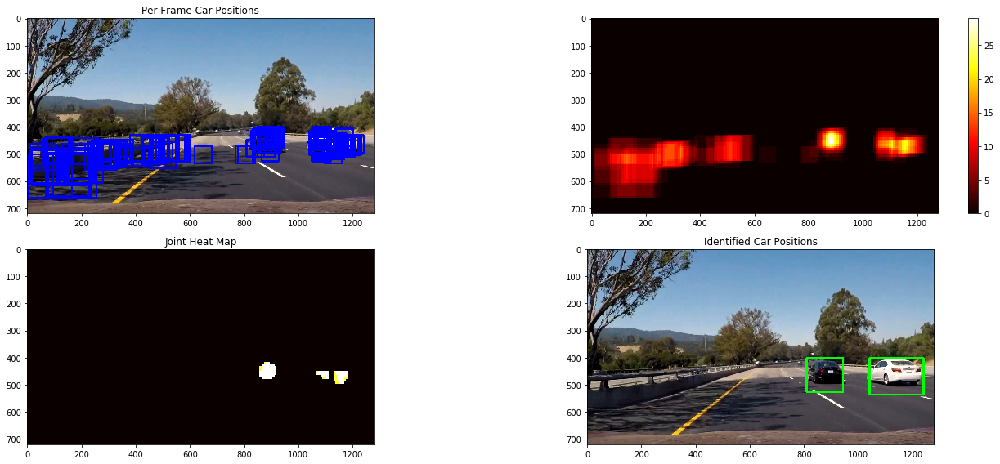

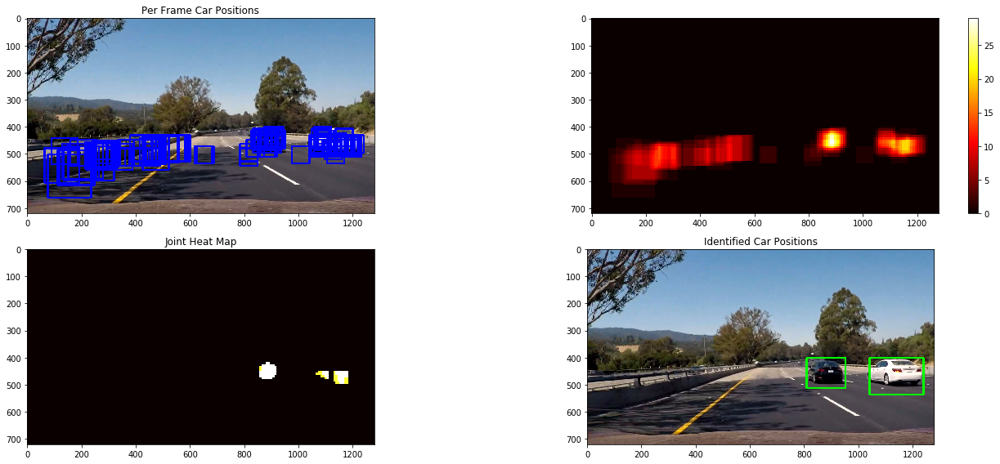

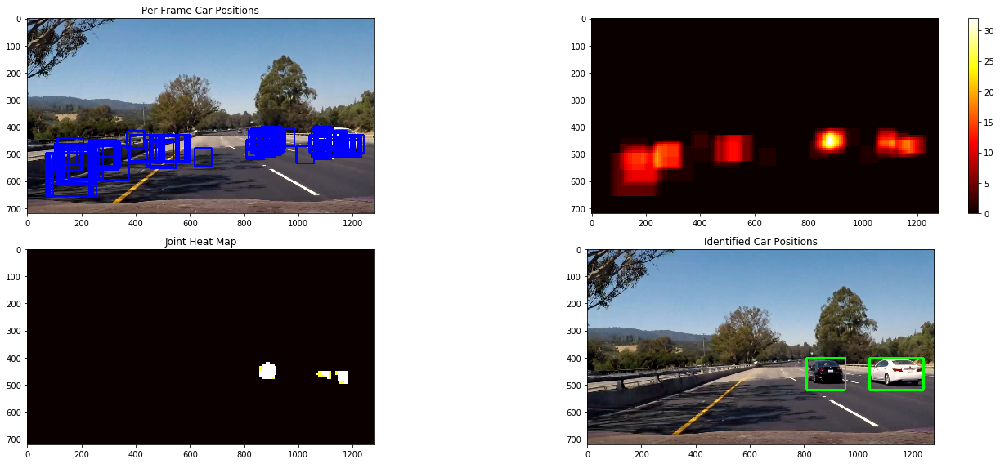

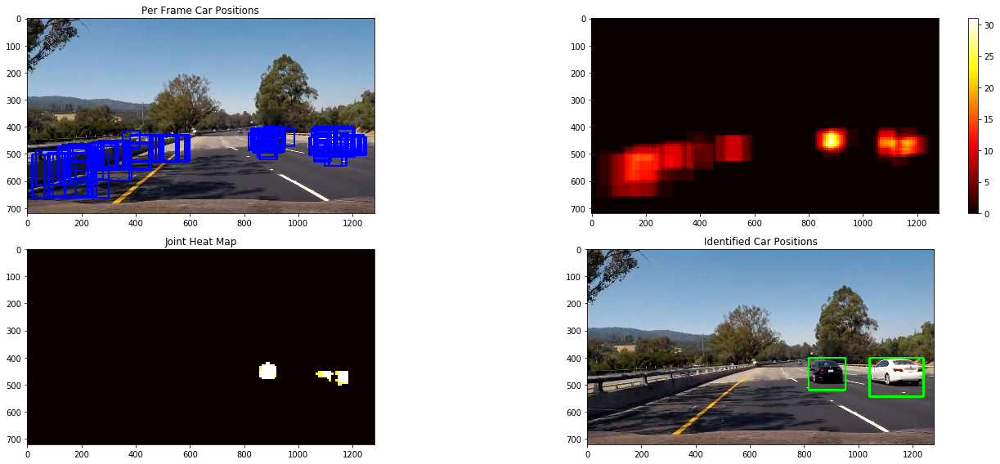

In [64]:
hot_window_record = HotWindowHistory_V2(image_size = test_image.shape[0:2], 
                                     n_frame = 5,
                                     per_frame_threshold=15,
                                     threshold=4)
car_collection = []
for test_image in test_images:

    bbox_list, joint_heatmap = process_frame_to_bbox(test_image)
    
    
    # visualize current hot windows


    # visualize heatmap
    # Visualize the heatmap when displaying    
    #heatmap = np.clip(heat, 0, 255)

                
    # remove object with low probability        
    #x_centroid = np.median(nonzero[1])
    #y_centroid = np.median(nonzero[0])
    
    fig = plt.figure(figsize=(20,8))
    
    


    
    
    plt.subplot(221)
    draw_image = np.copy(test_image)
    window_img = draw_boxes(draw_image, hot_window_record.hot_windows_list[-1], color=(0, 0, 255), thick=6)                    
    #plt.figure(figsize=(20,8))
    #plt.imshow(window_img)
    plt.imshow(window_img)
    plt.title('Per Frame Car Positions')
    
    plt.subplot(222)
    plt.imshow(hot_window_record.heat_list[-1], cmap='hot')
    plt.colorbar()
    
    plt.subplot(223)
    plt.imshow(joint_heatmap.astype(np.float), cmap='hot')
    plt.title('Joint Heat Map')
    
    if bbox_list is not None:
        plt.subplot(224)

        fig.tight_layout()
        bbox_on_img = draw_boxes(np.copy(test_image), [((w[0],w[1]), (w[2], w[3])) for w in bbox_list.astype(np.int)],
                                color=(0,255,0))
        plt.imshow(bbox_on_img)    
        plt.title('Identified Car Positions')
    plt.show()